# Data acquisition

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

### Caricamento file train.csv

In [15]:
file_path= "../../train.csv"
df = pd.read_csv(file_path)

In [16]:
df.head() 

,Year,S0,S1,S2,S3,S4,S5,S6,S7,S8,...,S80,S81,S82,S83,S84,S85,S86,S87,S88,S89
0,2007,44.76752,114.82099,3.83239,27.99928,1.49153,-15.90853,28.24844,3.61650,-7.24653,...,-1.89619,-471.02844,411.56205,443.01198,19.30254,309.07806,-336.91706,-14.70547,-474.44157,31.32820
1,2004,52.28942,75.73319,11.35941,-6.20582,-27.64559,-30.75995,12.50955,7.47877,9.88498,...,4.57060,1.36110,-6.52977,59.48672,3.69790,-36.92252,44.08077,3.39993,-70.07591,3.86143
2,2005,33.81773,-139.07371,134.19332,17.85216,63.47408,-25.28005,-34.65911,-5.99135,1.27848,...,54.16608,15.04530,39.09107,39.03041,3.68708,-61.88547,45.68115,6.39822,3.24471,35.74749
3,1998,41.60866,3.17811,-3.97174,23.53564,-19.68553,20.74407,18.80866,6.24474,-7.98424,...,28.08591,295.88684,54.02395,102.02880,40.47711,15.10258,-250.32293,2.81288,56.05172,3.60432
4,1987,44.49525,-32.25270,58.08217,3.73684,-32.53274,-18.72885,-15.85665,-3.34607,22.63786,...,31.44988,-136.50457,-85.11989,-74.96342,9.56921,-100.61689,-133.29315,9.19246,-97.37953,30.11015


In [17]:
print("Dimensione del dataframe")
print("- Righe: " + str(len(df.index)))
print("- Colonne: " + str(len(df.columns)))

Dimensione del dataframe
- Righe: 252175
- Colonne: 91


# Data Visualization

### Distribuzione delle canzoni per anno di pubblicazione 


Distribuzione delle canzoni per anno di pubblicazione:
Year
1956      283
1957      299
1958      291
1959      296
1960      212
1961      285
1962      302
1963      451
1964      473
1965      560
1966      689
1967      859
1968      934
1969     1105
1970     1174
1971     1065
1972     1144
1973     1298
1974     1092
1975     1241
1976     1089
1977     1251
1978     1463
1979     1554
1980     1551
1981     1581
1982     1798
1983     1693
1984     1684
1985     1789
1986     2110
1987     2561
1988     2805
1989     3335
1990     3628
1991     4323
1992     4771
1993     5263
1994     6061
1995     6629
1996     7065
1997     7591
1998     7907
1999     9119
2000     9642
2001    10795
2002    11726
2003    13691
2004    14803
2005    17476
2006    18767
2007    19702
2008    17380
2009    15519
Name: count, dtype: int64


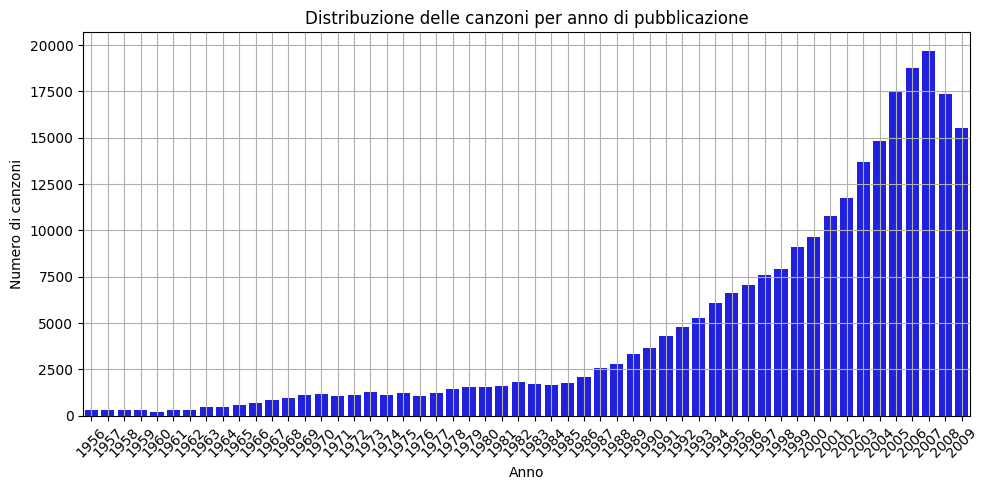

In [18]:
# Calcola la frequenza di canzoni per anno
year_distribution = df['Year'].value_counts().sort_index()

print("\nDistribuzione delle canzoni per anno di pubblicazione:")
print(year_distribution)

plt.figure(figsize=(10, 5)) 
sns.barplot(x=year_distribution.index, y=year_distribution.values, color='blue') 
plt.title('Distribuzione delle canzoni per anno di pubblicazione')
plt.xlabel('Anno')
plt.ylabel('Numero di canzoni')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()  
plt.show()

### Divisione in decenni

In [34]:
# Definisci i decenni come intervalli
decade_bins = list(range(1950, 2021, 10))
decade_labels = [f'{dec}-{dec+9}' for dec in decade_bins[:-1]]

# Aggiungi una colonna 'DecadeGroup' al DataFrame
df['DecadeGroup'] = pd.cut(df['Year'], bins=decade_bins, labels=decade_labels, include_lowest=True)

# Calcola il numero di canzoni per ogni 'DecadeGroup' usando 'value_counts'
decade_counts = df['DecadeGroup'].value_counts().sort_index()

# Crea un DataFrame ordinato con i risultati
decade_distribution_df = pd.DataFrame({
    'Decennio': decade_counts.index,
    'Numero di canzoni': decade_counts.values
})

print("Distribuzione delle canzoni per decennio:")
print(decade_distribution_df)

Distribuzione delle canzoni per decennio:
    Decennio  Numero di canzoni
0  1950-1959               1381
1  1960-1969               6832
2  1970-1979              12748
3  1980-1989              22984
4  1990-1999              68371
5  2000-2009             139859
6  2010-2019                  0


### Density plot delle features

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/3847024883.py:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5, ax=ax)
/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/3847024883.py:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5, ax=ax)
/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/3847024883.py:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5, ax=ax)
/var/folders/ht/ykt5nd_d1w55_nvpcj

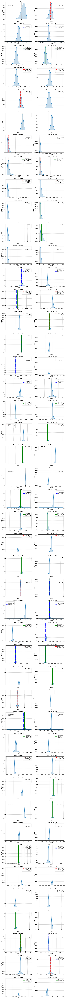

In [26]:
# Ottieni le colonne da plottare
columns_to_plot = [col for col in df.columns if col not in ['Year', 'DecadeGroup']]

# Calcola il numero di righe necessarie (due grafici per riga)
n_rows = (len(columns_to_plot) + 1) // 2

# Crea i subplot
fig, axes = plt.subplots(n_rows, 2, figsize=(12, n_rows * 4))  # Dimensione generale della griglia

# Itera sulle colonne e crea i grafici
for i, column in enumerate(columns_to_plot):
    ax = axes[i // 2, i % 2]  # Seleziona il subplot corretto

    # Traccia la curva di densità per la colonna
    sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5, ax=ax)

    # Calcola media, mediana e moda
    mean = df[column].mean()
    median = df[column].median()
    mode = df[column].mode()[0]

    # Aggiungi linee verticali per media, mediana e moda
    ax.axvline(mean, color='red', linestyle='--', linewidth=1.5, label=f'Media: {mean:.2f}')
    ax.axvline(median, color='green', linestyle='-', linewidth=1.5, label=f'Mediana: {median:.2f}')
    ax.axvline(mode, color='blue', linestyle='-.', linewidth=1.5, label=f'Moda: {mode:.2f}')

    ax.set_title(f'Density Plot per {column}', fontsize=14)
    ax.set_xlabel('Valore', fontsize=12)
    ax.set_ylabel('Densità', fontsize=12)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.6)

# Nascondi eventuali subplot vuoti
if len(columns_to_plot) % 2 != 0:
    fig.delaxes(axes[-1, -1])

plt.tight_layout()
plt.show()


### Boxplot delle features

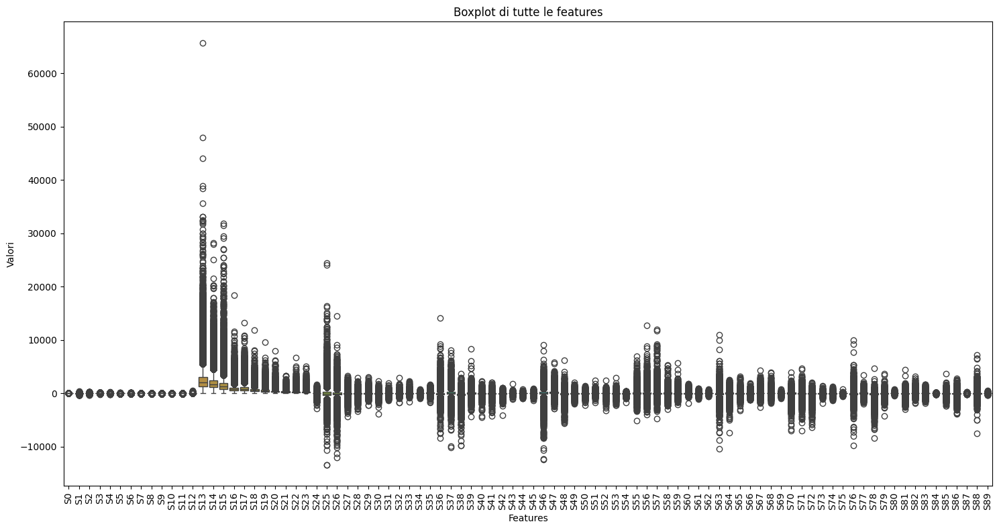

In [35]:
# Boxplot per ogni feature, raggruppando per anno
plt.figure(figsize=(15, 8))
sns.boxplot(data=df.drop(columns=['Year', 'DecadeGroup']), orient='v')  # boxplot verticale
plt.xticks(rotation=90) 
plt.xlabel('Features')
plt.ylabel('Valori')
plt.title('Boxplot di tutte le caratteristiche per anno')
plt.tight_layout()
plt.show()

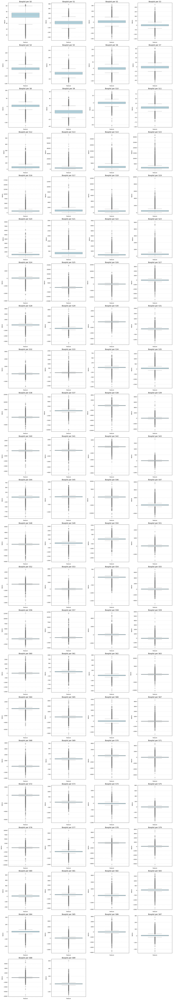

In [28]:
# Filtra le colonne di interesse
features = [column for column in df.columns if column not in ['Year', 'DecadeGroup']]

# Numero di boxplot per riga
ncols = 4
nrows = int(np.ceil(len(features) / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 5 * nrows))

axes = axes.flatten()

for i, column in enumerate(features):
    sns.boxplot(y=df[column], color='lightblue', ax=axes[i])
    axes[i].set_title(f'Boxplot per {column}', fontsize=14)
    axes[i].set_xlabel('Feature')
    axes[i].set_ylabel('Valore')
    axes[i].grid(True, linestyle='--', alpha=0.6)

for j in range(len(features), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

Visualizzazione solo di alcuni boxplot che hanno outliers elevati

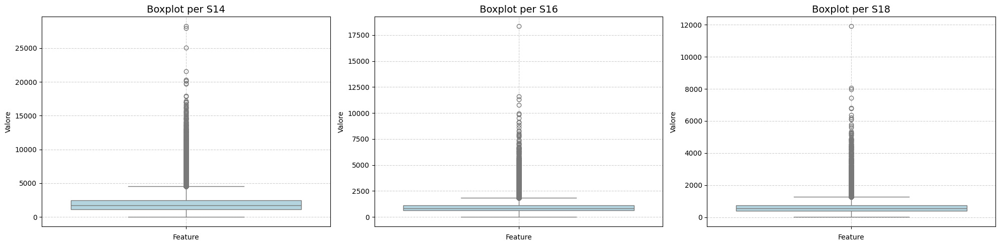

In [33]:
# Filtra solo le colonne S14, S16 e S18
features = ['S14', 'S16', 'S18']

# Numero di boxplot per riga
ncols = 3  # Poiché stai visualizzando solo 3 colonne
nrows = 1  # Solo una riga necessaria per 3 colonne

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 5))

# Se axes non è un array, lo trasformiamo in un array per iterare correttamente
if nrows * ncols == 1:
    axes = [axes]

for i, column in enumerate(features):
    sns.boxplot(y=df[column], color='lightblue', ax=axes[i])
    axes[i].set_title(f'Boxplot per {column}', fontsize=14)
    axes[i].set_xlabel('Feature')
    axes[i].set_ylabel('Valore')
    axes[i].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()


### Visualizzazione outliers

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/2420319750.py:49: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/Users/martinadaghia/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


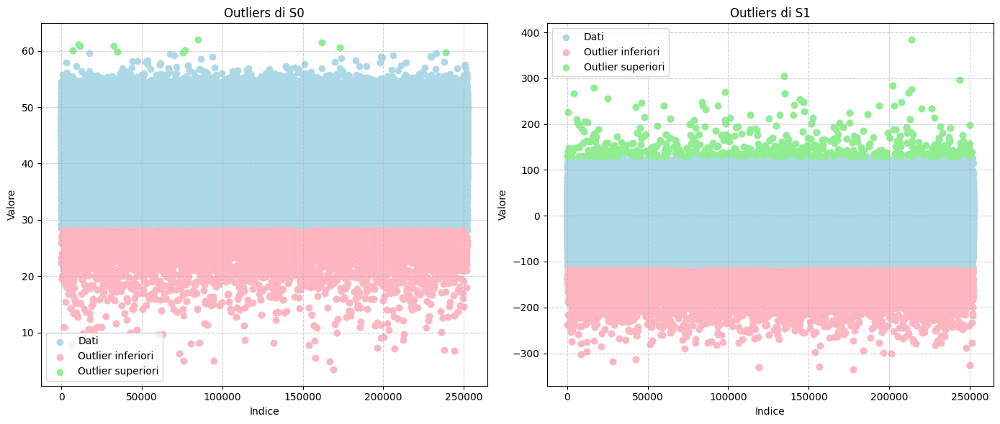

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/2420319750.py:49: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


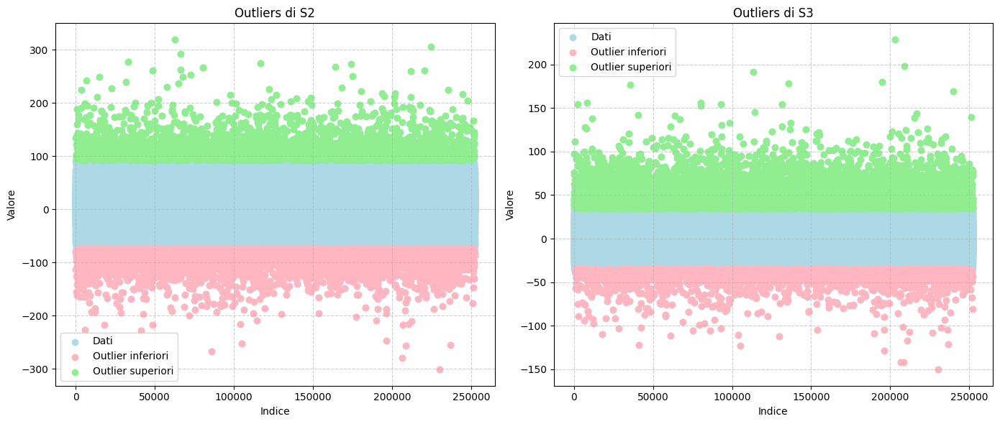

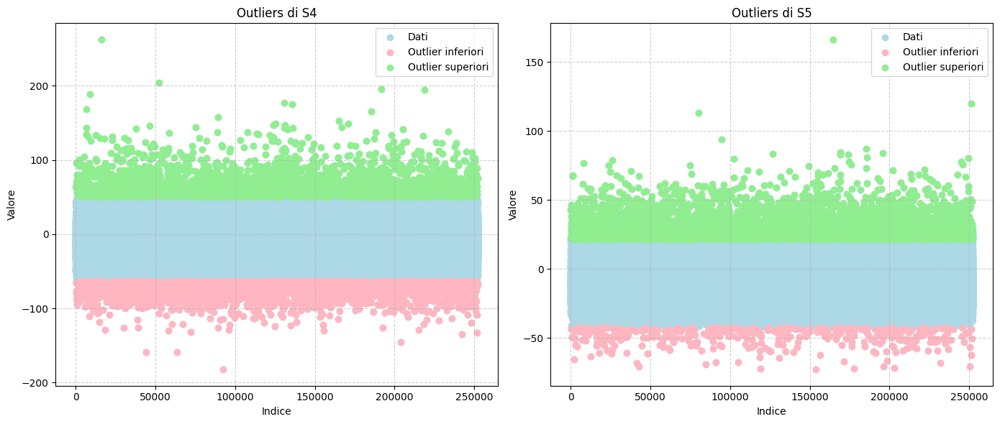

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/2420319750.py:49: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/Users/martinadaghia/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


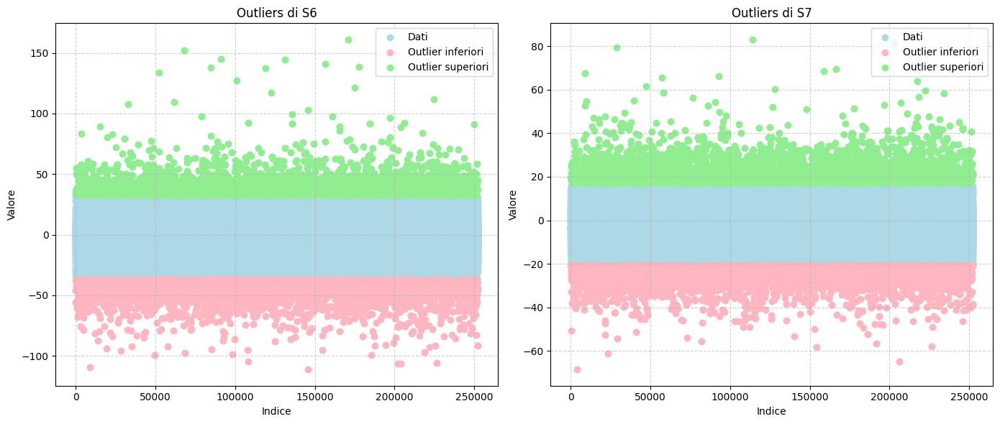

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/2420319750.py:49: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/Users/martinadaghia/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


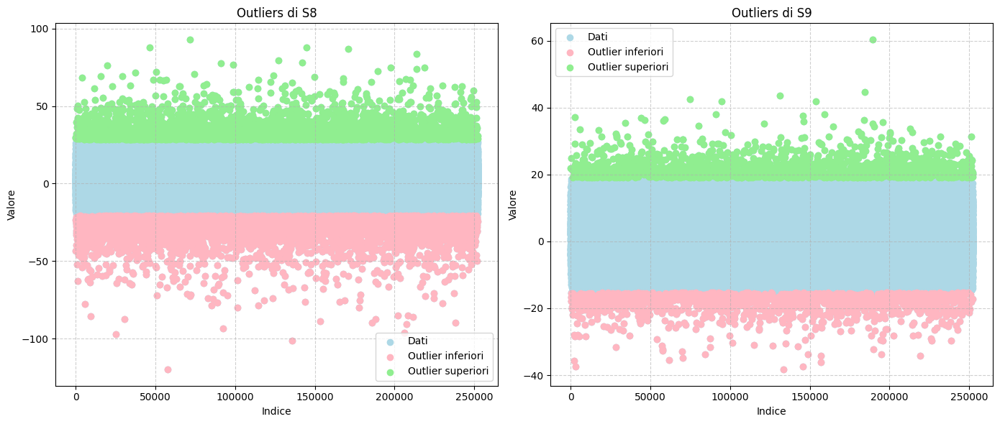

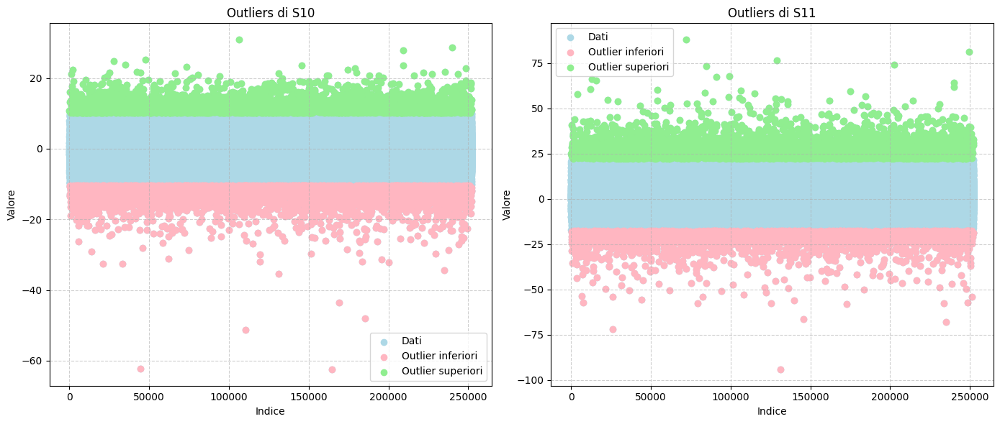

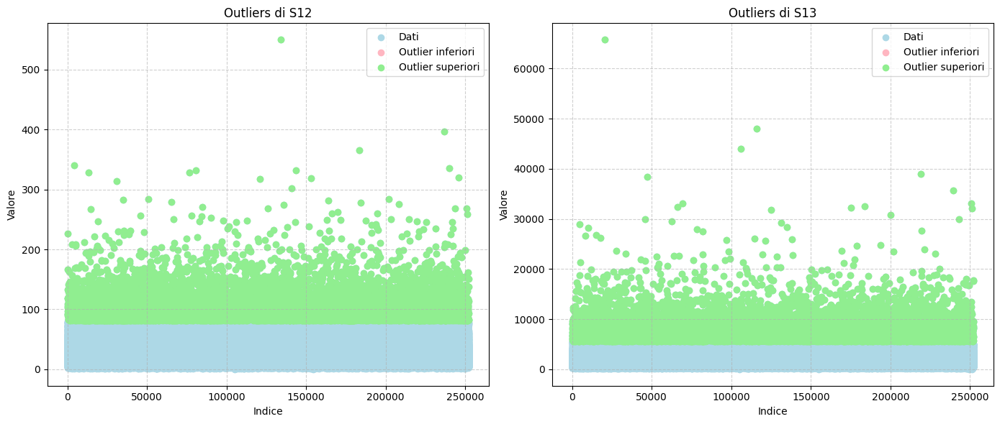

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/2420319750.py:49: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


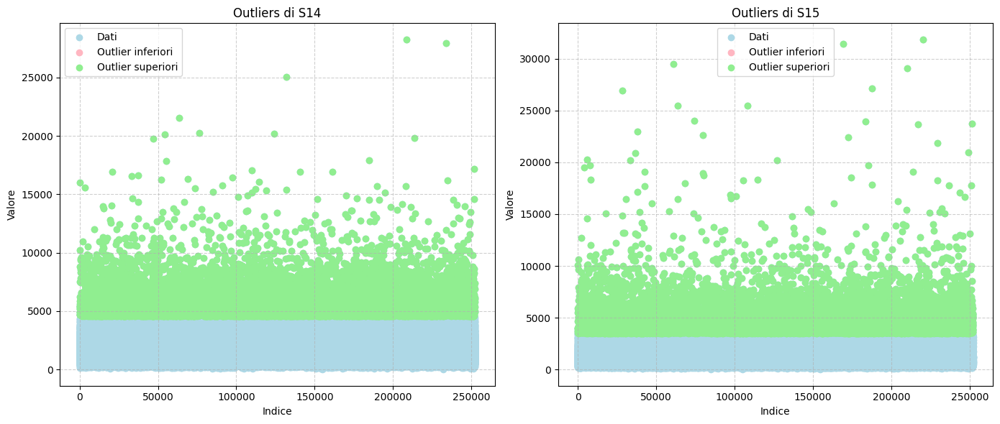

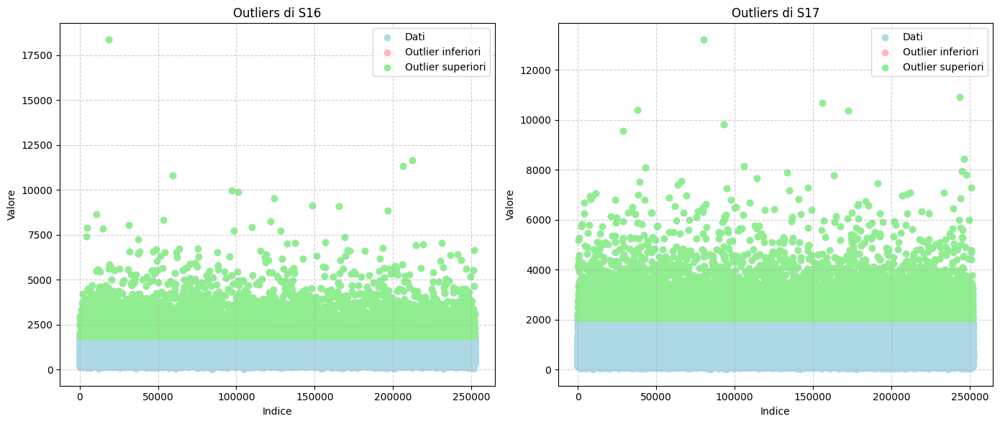

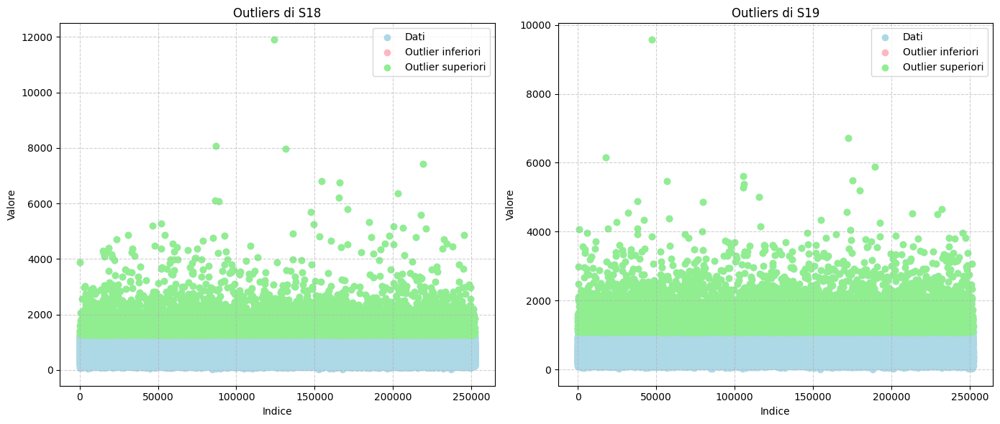

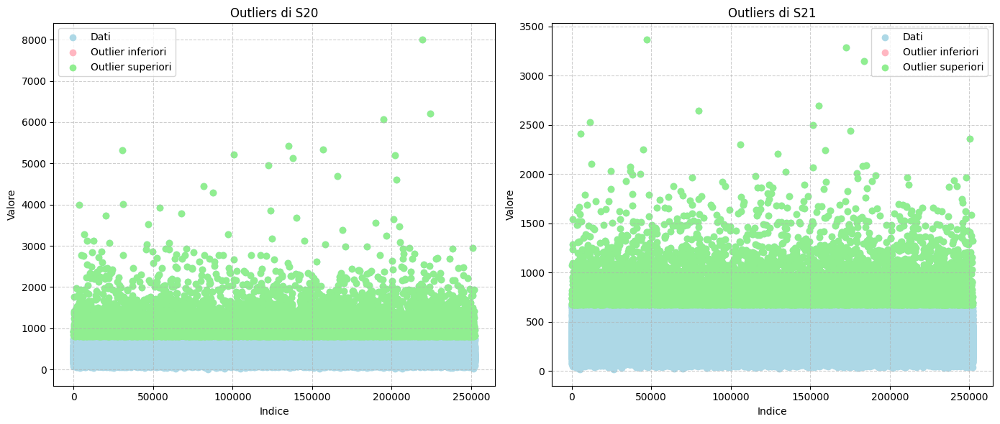

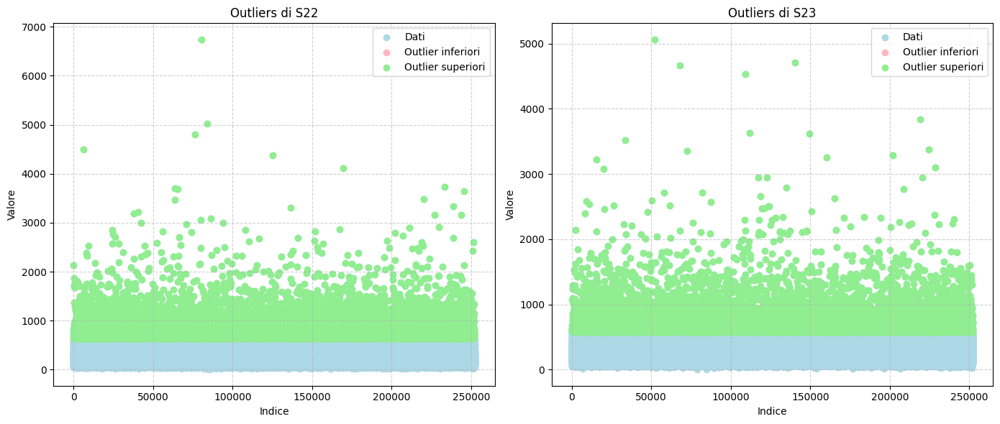

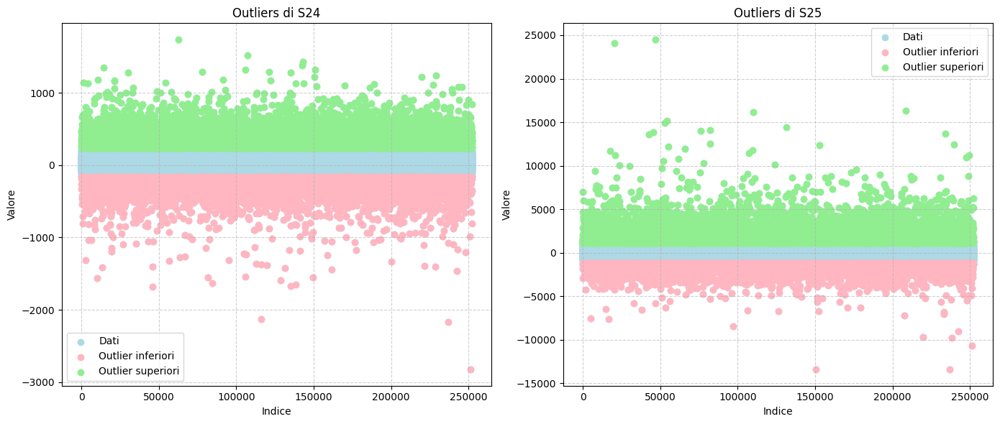

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/2420319750.py:49: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/Users/martinadaghia/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


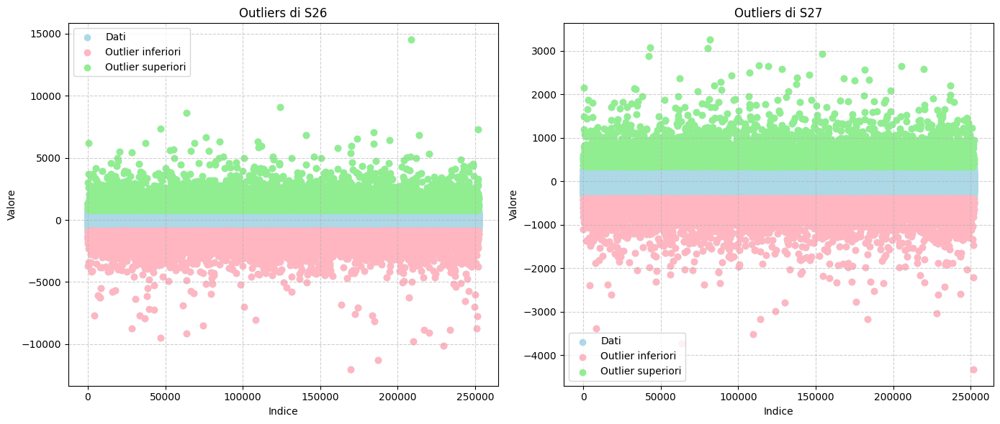

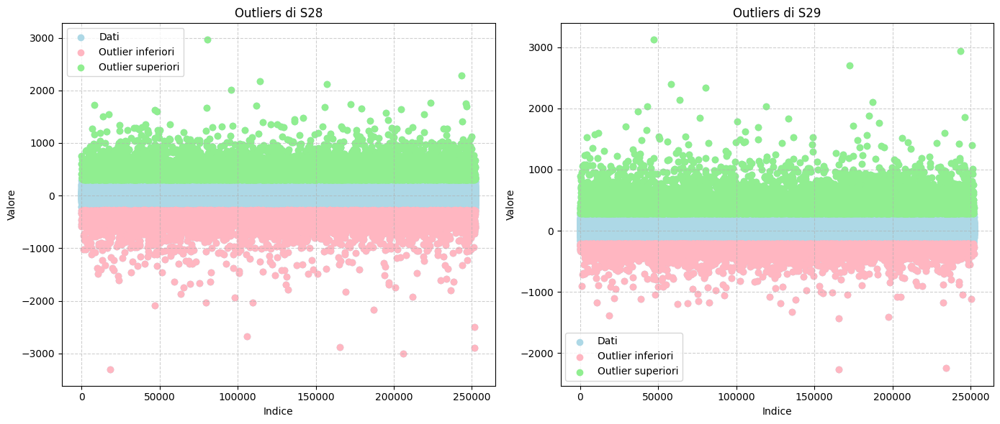

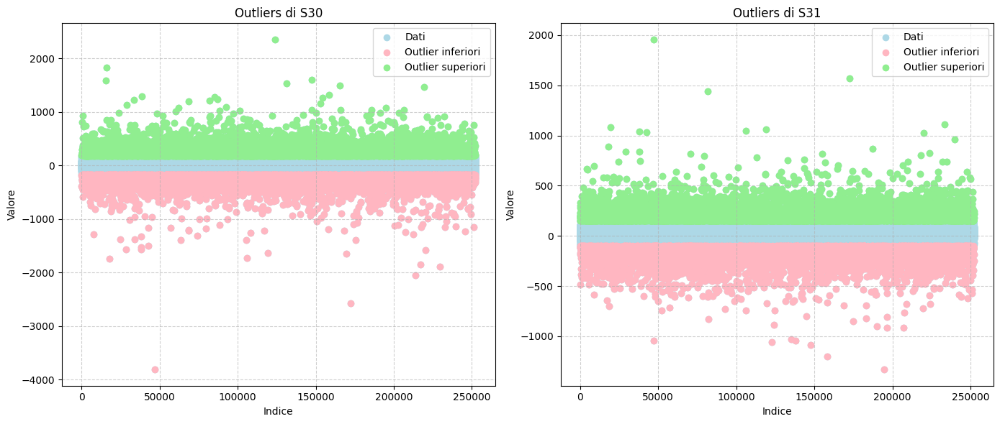

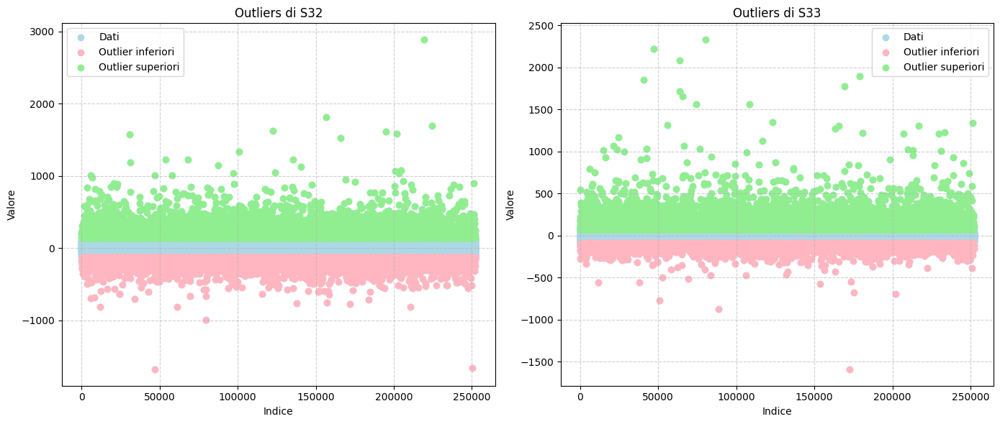

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/2420319750.py:49: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


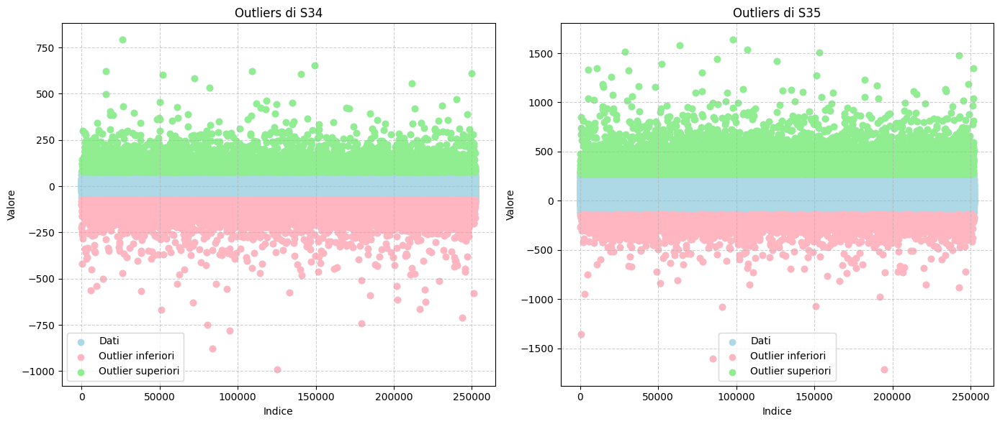

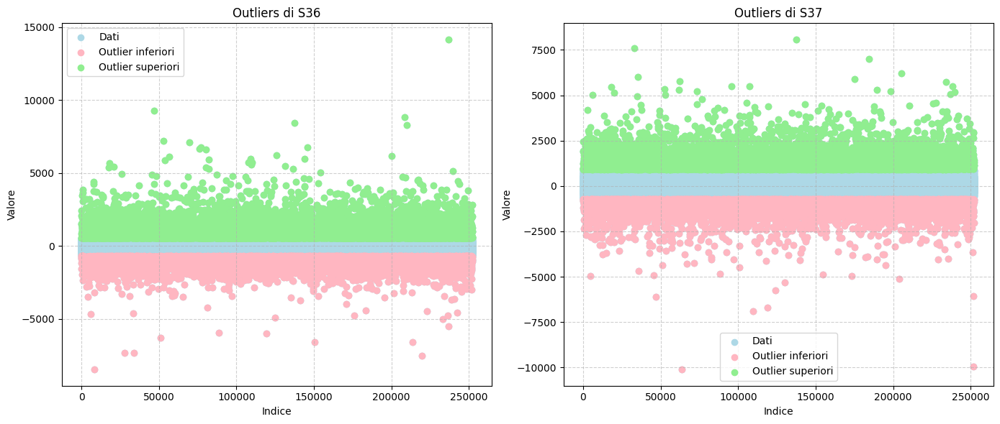

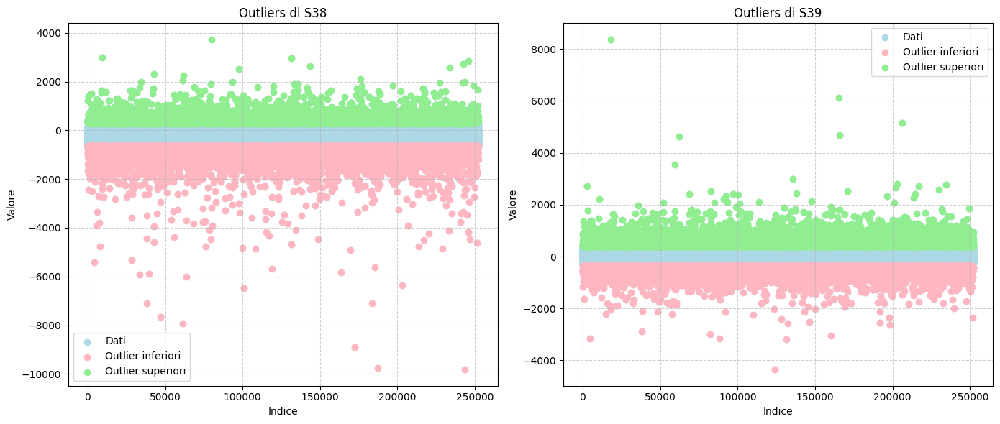

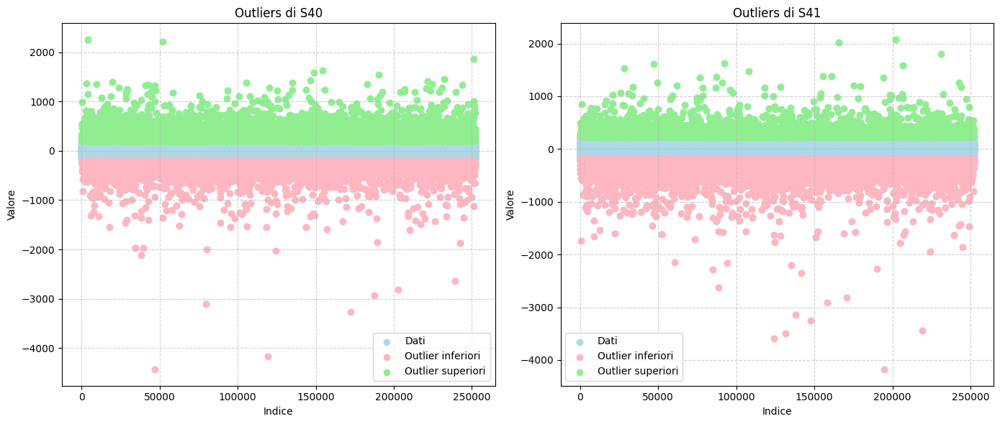

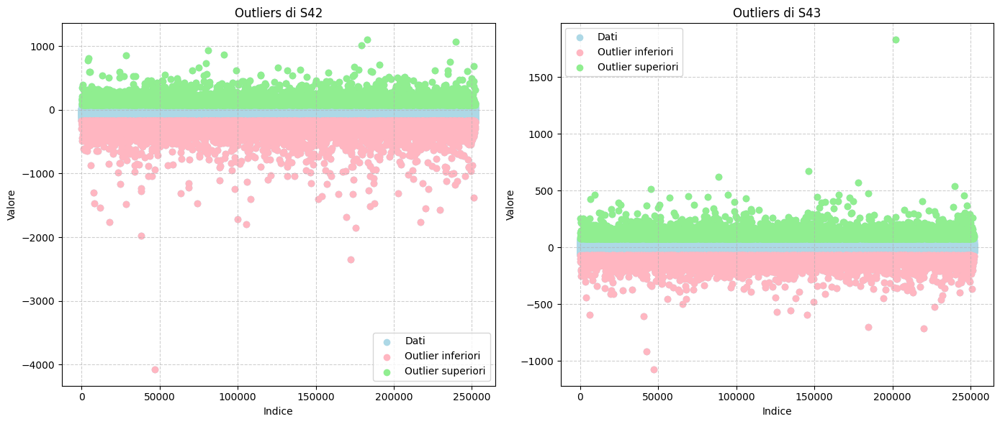

...

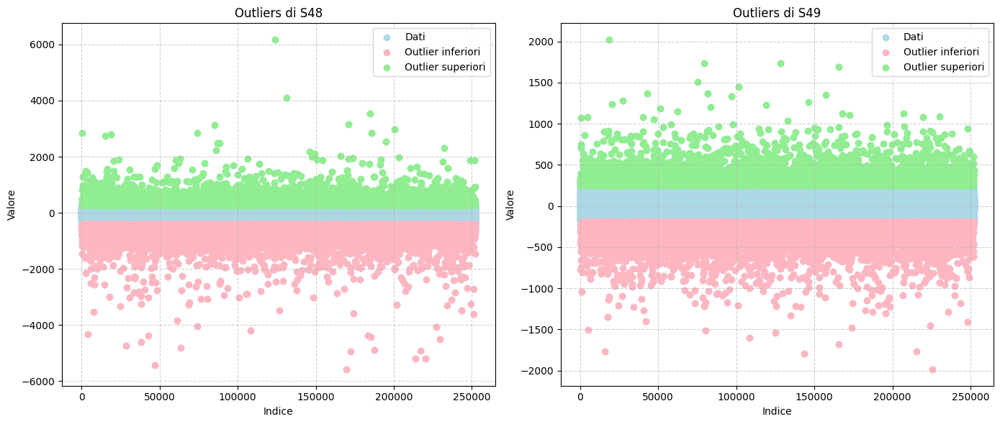

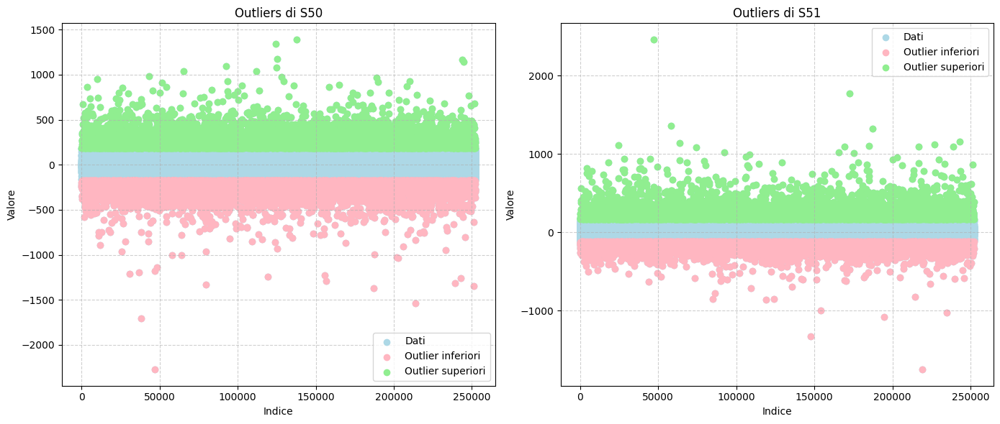

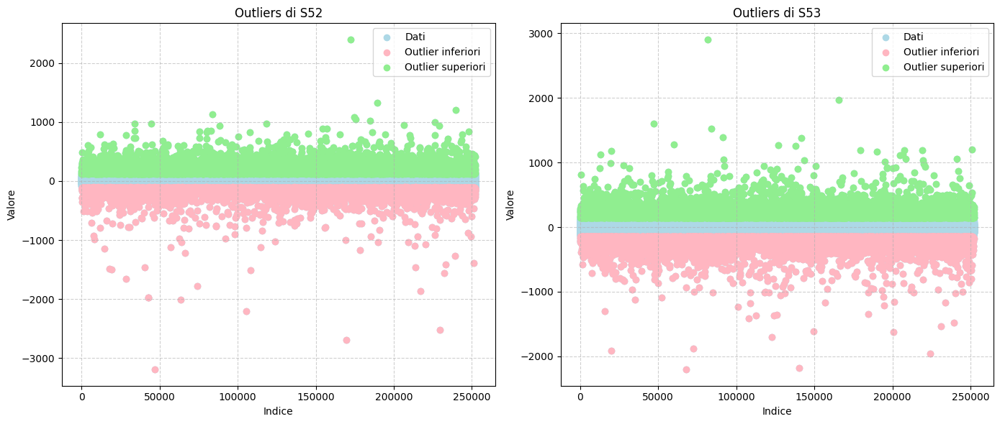

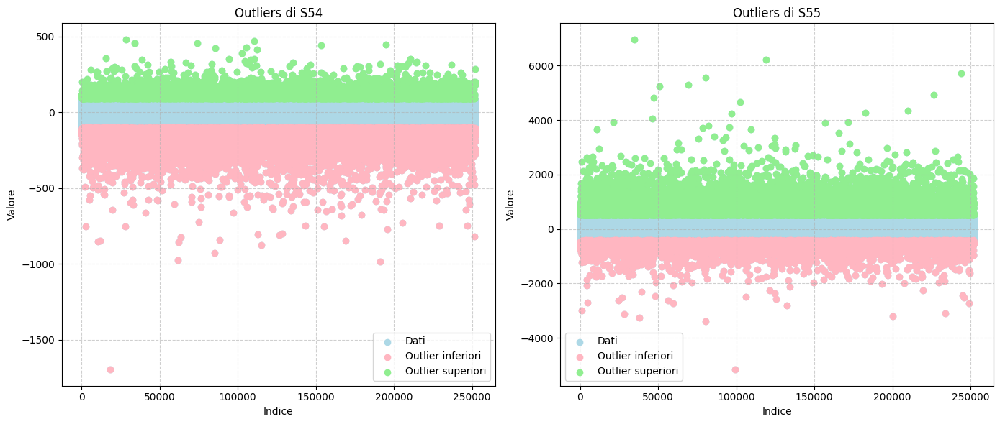

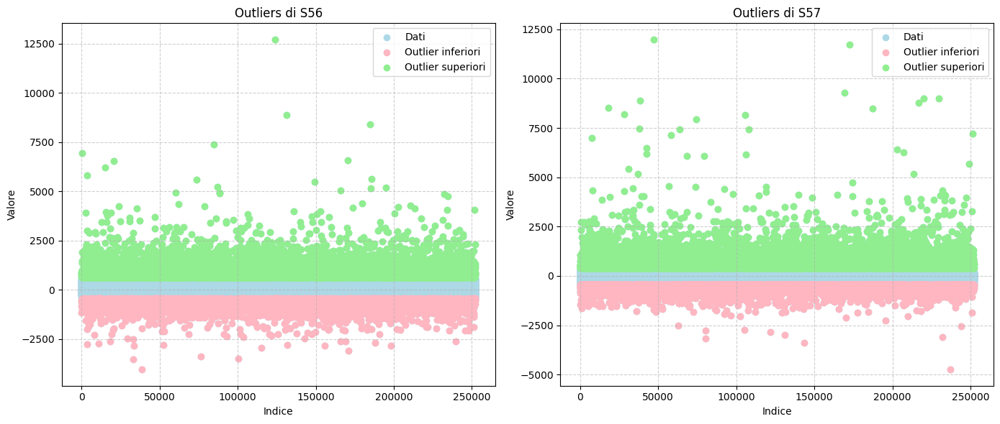

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/2420319750.py:49: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/Users/martinadaghia/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


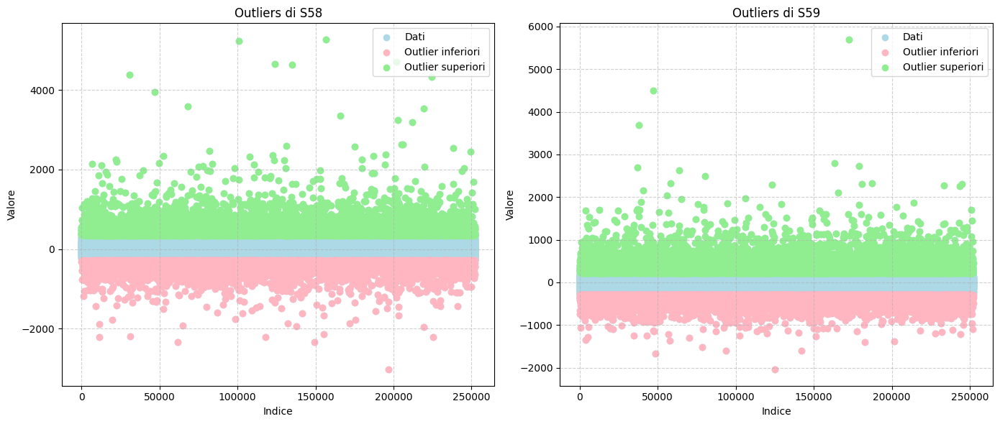

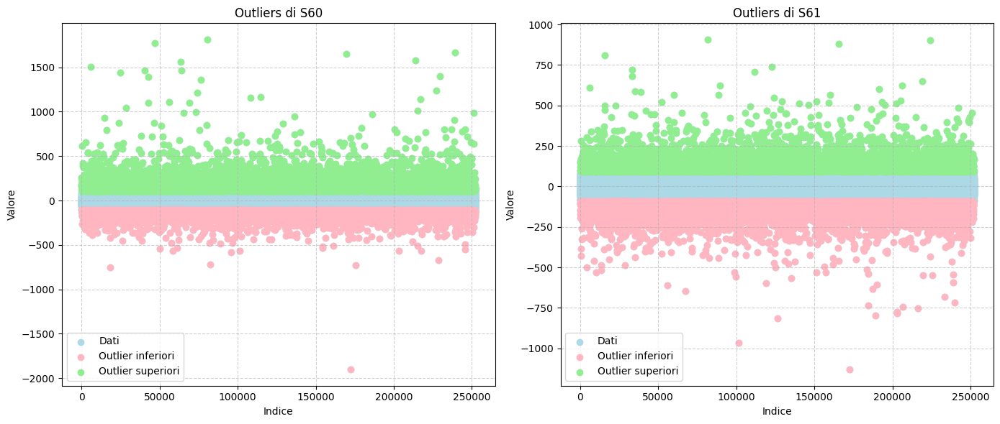

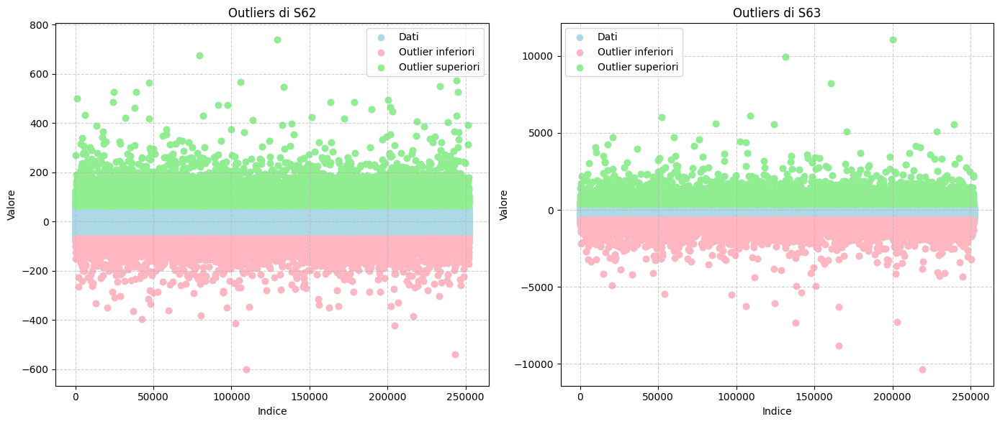

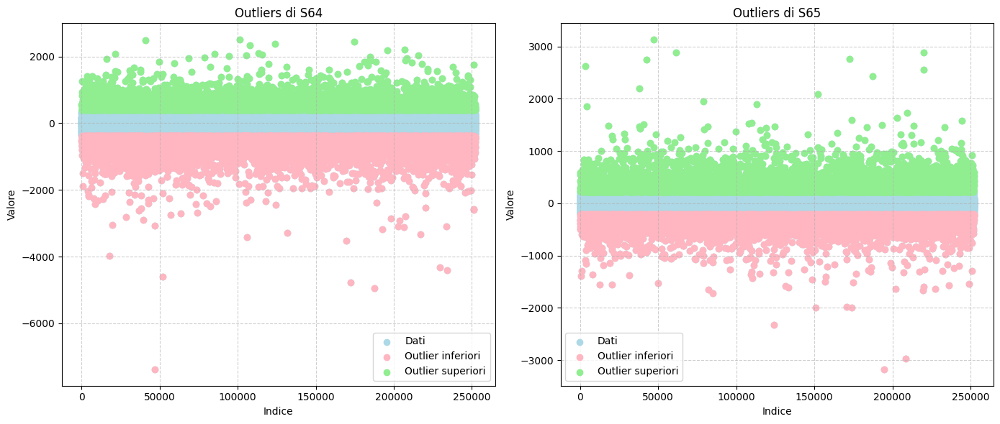

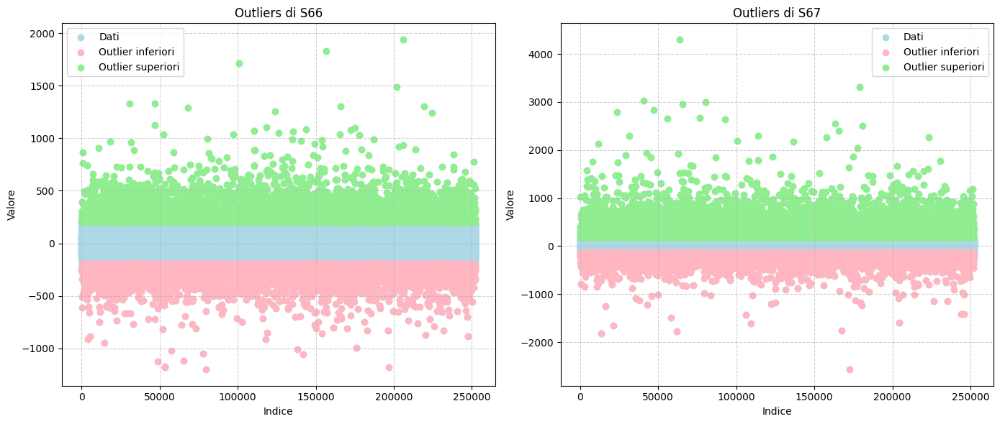

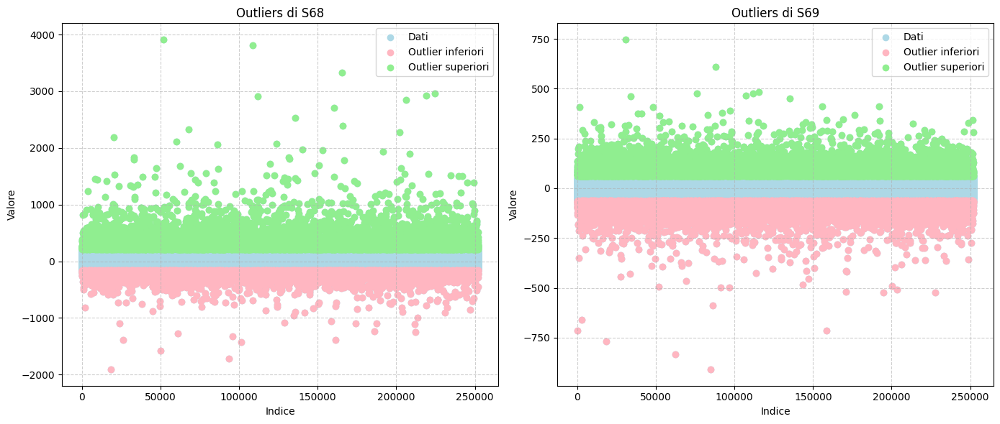

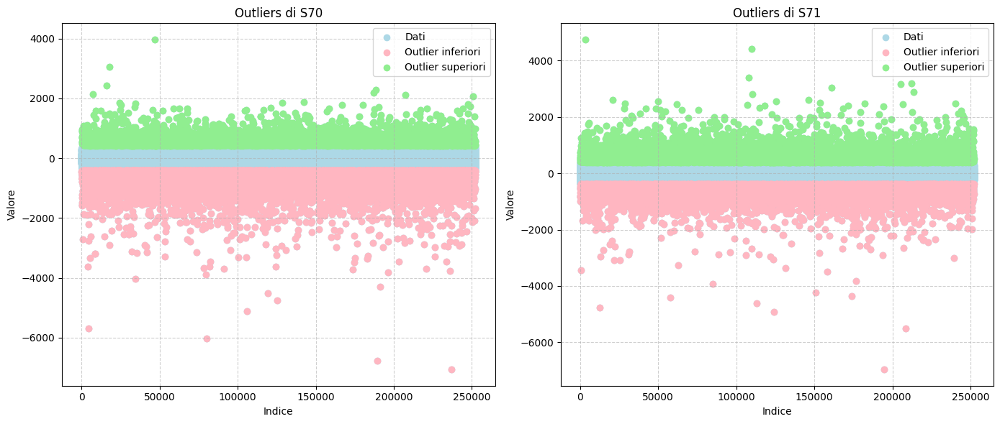

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/2420319750.py:49: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


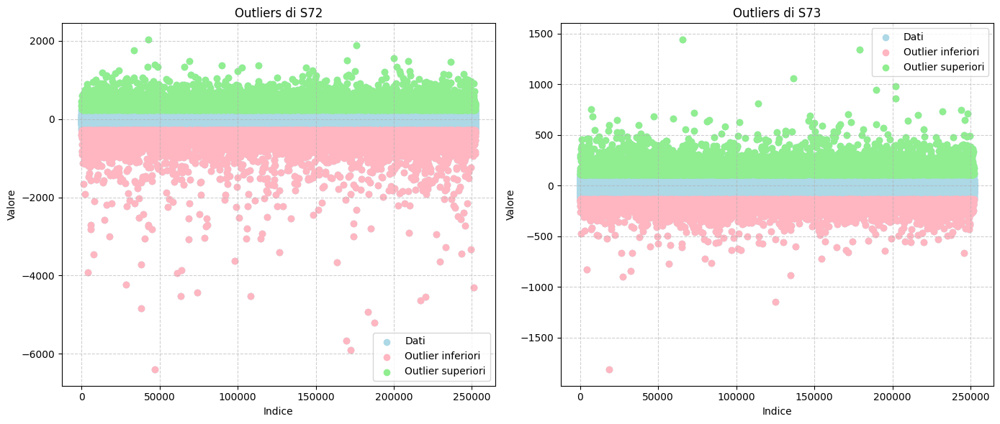

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/2420319750.py:49: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


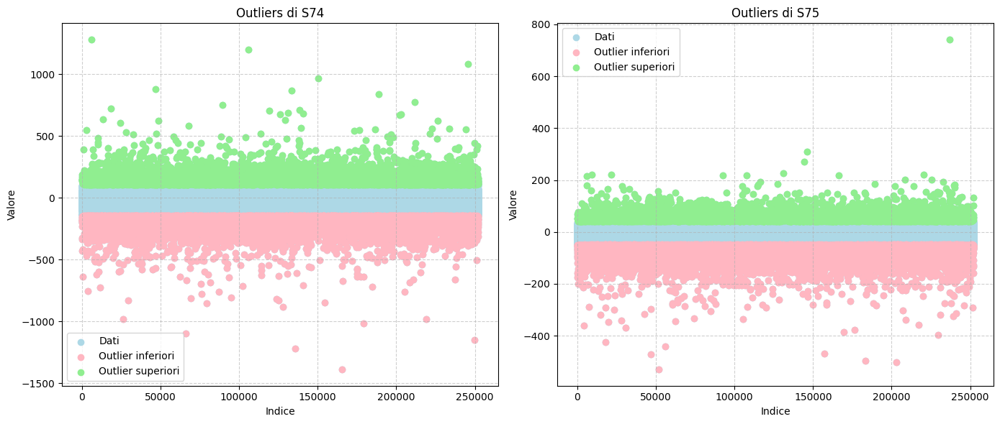

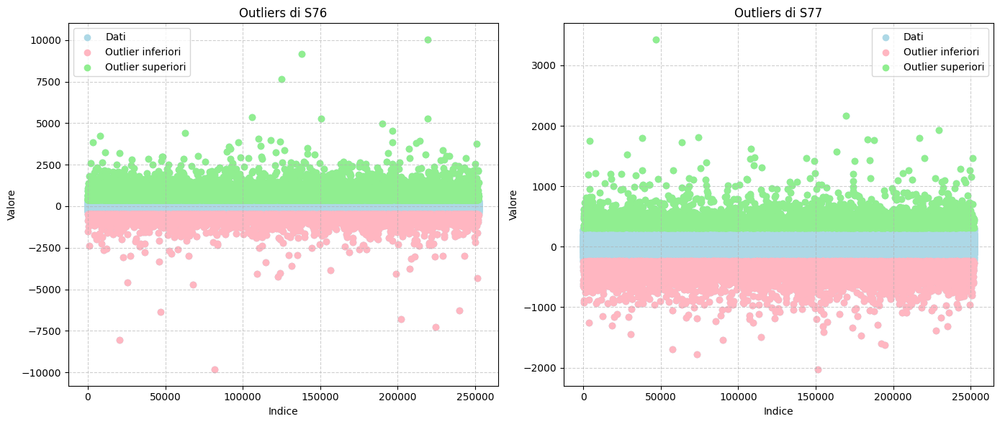

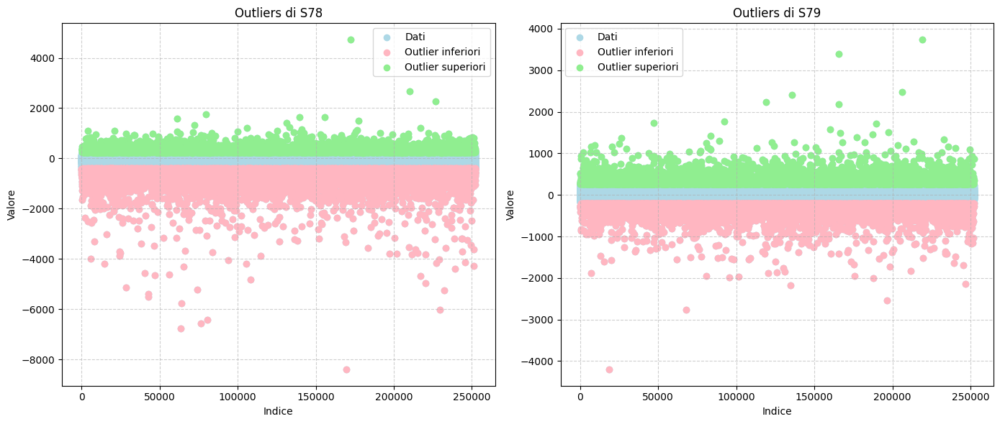

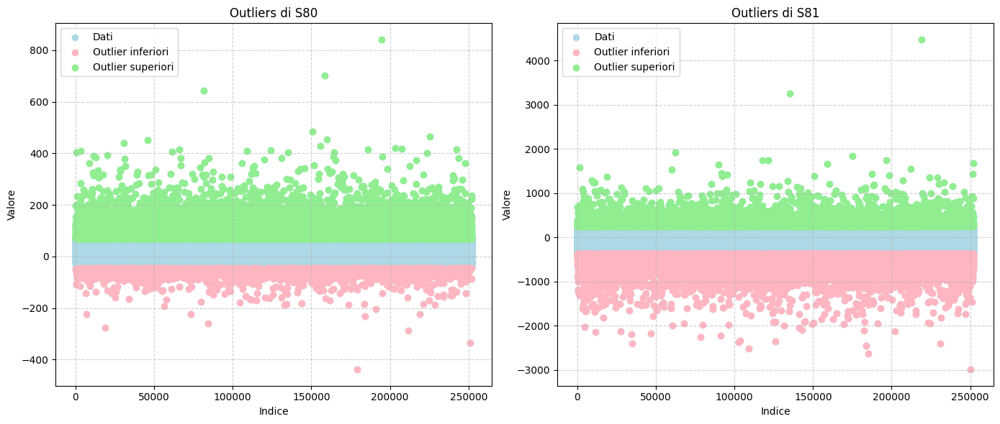

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/2420319750.py:49: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


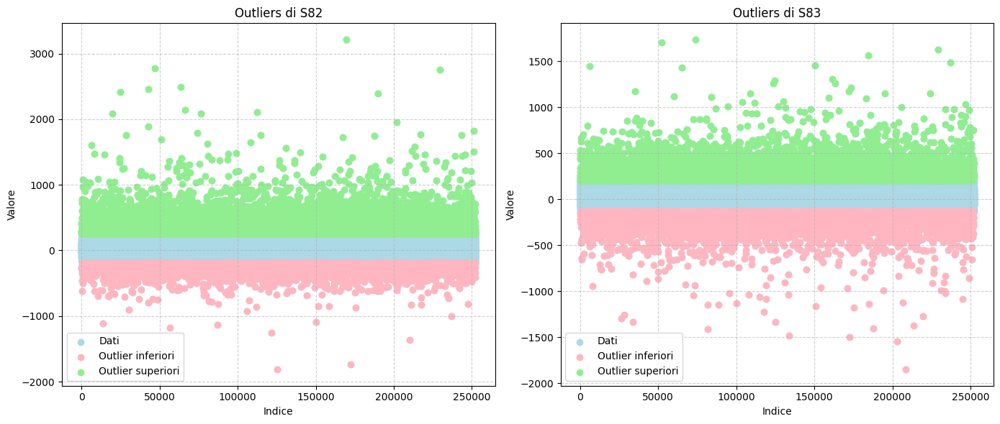

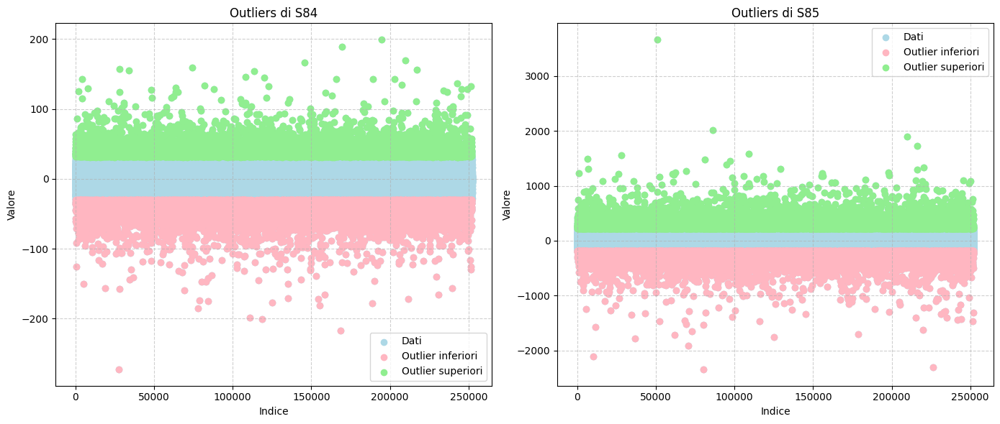

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_41777/2420319750.py:49: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


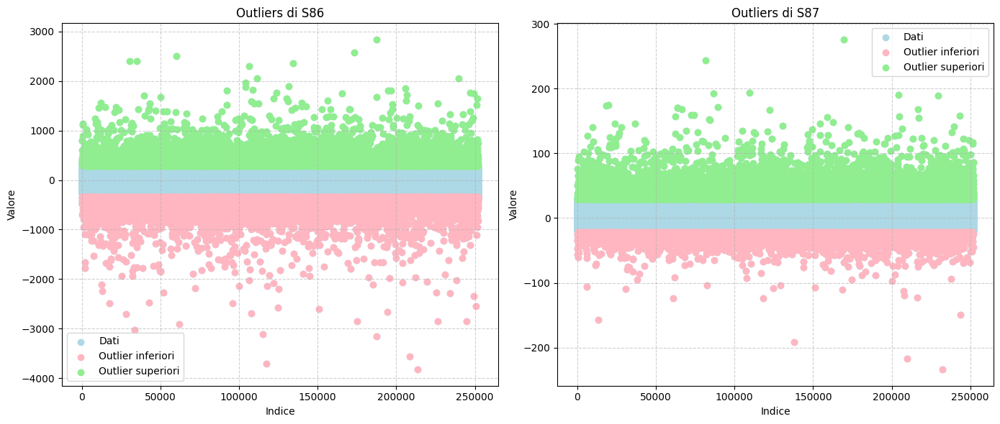

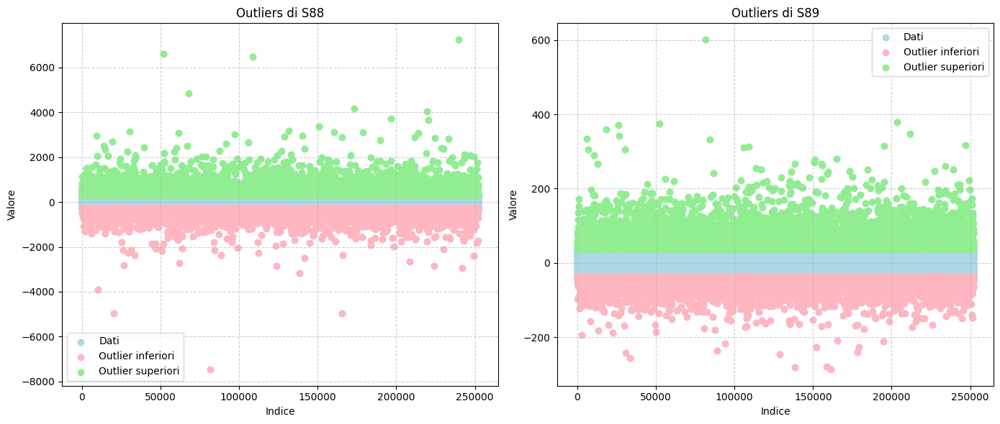

   Colonna  Numero Outliers Percentuale Outliers
0       S0             5306                2.10%
1       S1             7313                2.90%
2       S2             7484                2.97%
3       S3            11229                4.45%
4       S4             5224                2.07%
..     ...              ...                  ...
85     S85            16608                6.59%
86     S86            15876                6.30%
87     S87            14794                5.87%
88     S88            19031                7.55%
89     S89            19330                7.67%

[90 rows x 3 columns]


In [30]:
# Seleziona solo le colonne che iniziano con 'S'
colonne_s = [col for col in df.columns if col.startswith('S')]

# Lista per memorizzare i risultati
risultati_outliers = []

# Ciclo attraverso ogni colonna 'S'
for i, col in enumerate(colonne_s):
    # Calcola i quantili e l'IQR (Interquartile Range)
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    
    # Calcola i baffi inferiori e superiori
    baffo_inferiore = q1 - 1.5 * iqr
    baffo_superiore = q3 + 1.5 * iqr
    
    # Trova gli outliers inferiori e superiori
    outliers_inferiori = df[df[col] < baffo_inferiore]
    outliers_superiori = df[df[col] > baffo_superiore]
    numero_outliers = len(outliers_inferiori) + len(outliers_superiori)
    
    # Calcola la percentuale di outliers
    percentuale_outliers = (numero_outliers / len(df)) * 100
    
    # Aggiungi i risultati alla lista
    risultati_outliers.append({
        'Colonna': col,
        'Numero outliers': numero_outliers,
        'Percentuale outliers': f'{percentuale_outliers:.2f}%'
    })
    
    # Crea un grafico a dispersione per gli outlier su una griglia 2x1
    if i % 2 == 0:  # Ogni due colonne, crea una nuova figura con due subplot
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # Due grafici sulla stessa riga
    
    ax = axes[i % 2]
    ax.scatter(df.index, df[col], color='#ADD8E6', label='Dati')
    ax.scatter(outliers_inferiori.index, outliers_inferiori[col], color='#FFB6C1', label='Outlier inferiori')
    ax.scatter(outliers_superiori.index, outliers_superiori[col], color='#90EE90', label='Outlier superiori')
    ax.set_title(f'Outliers di {col}')
    ax.set_xlabel('Indice')
    ax.set_ylabel('Valore')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.6)
    
    # Mostra i grafici ogni due colonne
    if i % 2 == 1 or i == len(colonne_s) - 1:
        plt.tight_layout()
        plt.show()

# Converti i risultati in un DataFrame e stampalo
df_outliers = pd.DataFrame(risultati_outliers)
print(df_outliers)


### Matrice di correlazione

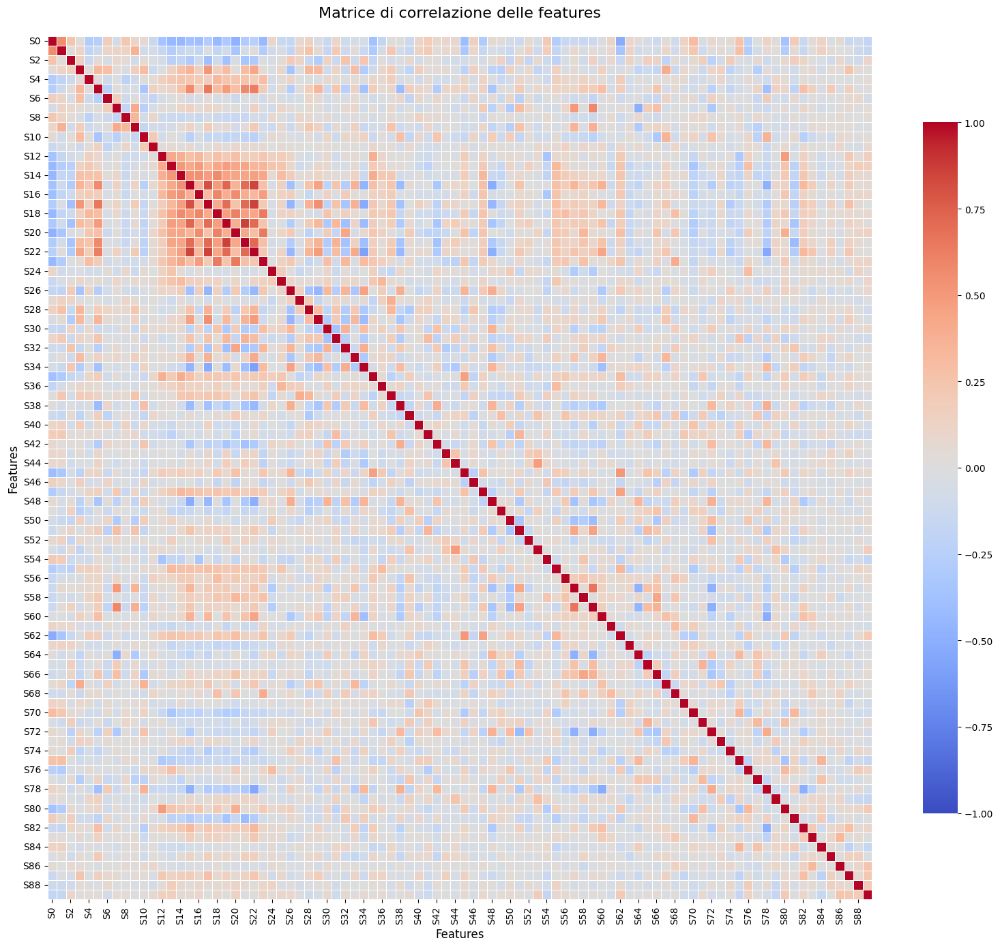

In [32]:
# Calcola la matrice di correlazione
correlation_matrix = df.drop(columns=['Year', 'DecadeGroup']).corr()

plt.figure(figsize=(16, 14))

# Crea una heatmap della matrice di correlazione senza annotazioni
sns.heatmap(
    correlation_matrix, 
    annot=False,  # annotazioni numeriche
    cmap='coolwarm', 
    linewidths=0.5, 
    vmin=-1, 
    vmax=1,
    cbar_kws={"shrink": 0.8} 
)

plt.title('Matrice di correlazione delle features', fontsize=16, pad=20)
plt.xlabel('Features', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.tight_layout()
plt.show()